# PROBLEMA DE NEGÓCIO 
O CEO DA EMPRESA PEDIU PARA QUE SOMASSEMOS TODOS OS LUCROS DE TODO O MÊS DE 2020 E PREVER O LUCRO POSTERIOR
A 6 MESES DA LOJA MAIS VENDIDA 

# IMPORTAÇÃO DE DADOS

In [1]:
#Importação de pacotes
import warnings
warnings.filterwarnings("ignore") 
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
df = pd.read_csv('test_ts_data.csv')
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
#pd.options.display.float_format = '{:.2f}'.format

# PRIMEIRAS VISUALIZAÇÕES

In [2]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 946500 entries, 0 to 946499
Data columns (total 4 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   x       946500 non-null  object 
 1   y       946500 non-null  float64
 2   item    946500 non-null  int64  
 3   store   946500 non-null  int64  
dtypes: float64(1), int64(2), object(1)
memory usage: 28.9+ MB


In [3]:
df.head()

,x,y,item,store
0,2015-01-04,51.922151,1,1
1,2015-01-11,39.768148,1,1
2,2015-01-18,24.558860,1,1
3,2015-01-25,40.584438,1,1
4,2015-02-01,15.148615,1,1


# MANIPULAÇÃO E TRTATAMENTO DE DADOS

In [4]:
df['x'] = pd.to_datetime(df['x'], format='%Y-%m-%d')


In [5]:
(df.isnull().sum() / len(df['x']))*100

x        0.0
y        0.0
item     0.0
store    0.0
dtype: float64

In [6]:
df.duplicated().sum()

0

# ANÁLISE EXPLORATÓRIA

In [7]:
df.describe()

,x,y,item,store
count,946500,946500.000000,946500.000000,946500.000000
mean,2017-11-01 15:46:50.396196608,51.817784,35.514422,25.500000
min,2015-01-04 00:00:00,0.000000,1.000000,1.000000
25%,2016-06-26 00:00:00,36.708045,18.000000,13.000000
50%,2017-11-19 00:00:00,54.882455,35.000000,25.500000
75%,2019-03-17 00:00:00,70.767555,53.000000,38.000000
max,2020-06-28 00:00:00,336.038066,70.000000,50.000000
std,NaN,29.785439,20.272461,14.430877


### MODA

In [8]:
from statistics import mode
mode(df['x'])

Timestamp('2018-12-30 00:00:00')

In [9]:
mode(df['y'])

0.0

In [10]:
mode(df['item'])

1

In [11]:
mode(df['store'])

1

### ASSIMETRIA

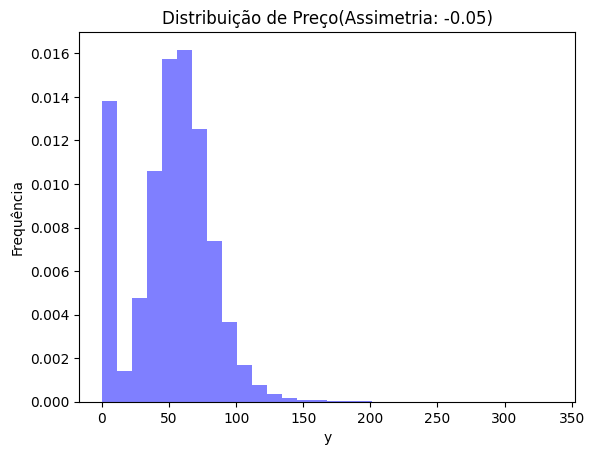

In [12]:
from scipy.stats import skew

y = df['y']

# Calculando a assimetria dos dados
assimetria = skew(y)

# Criando um histograma para visualizar a distribuição dos dados
plt.hist(y, bins=30, density=True, alpha=0.5, color='b')

# Adicionando informações ao gráfico
plt.title(f'Distribuição de Preço(Assimetria: {assimetria:.2f})')
plt.xlabel('y')
plt.ylabel('Frequência')

# Exibindo o gráfico
plt.show()

### CURTOSE

In [13]:
df['y'].kurt()

0.4993592201475421

### HISTOGRAMA

array([[<Axes: title={'center': 'x'}>, <Axes: title={'center': 'y'}>],
       [<Axes: title={'center': 'item'}>,
        <Axes: title={'center': 'store'}>]], dtype=object)

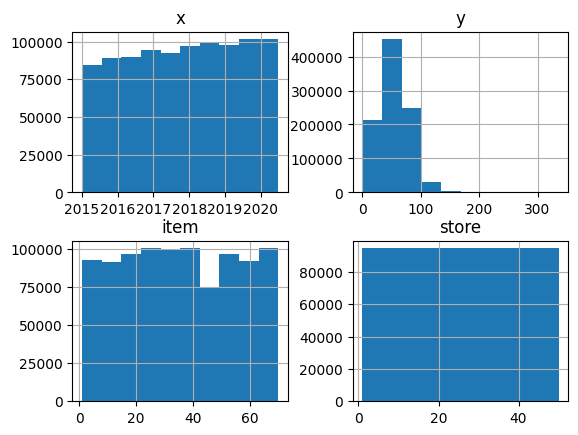

In [14]:
df.hist()

array([[<Axes: title={'center': 'x'}>, <Axes: title={'center': 'y'}>],
       [<Axes: title={'center': 'item'}>,
        <Axes: title={'center': 'store'}>]], dtype=object)

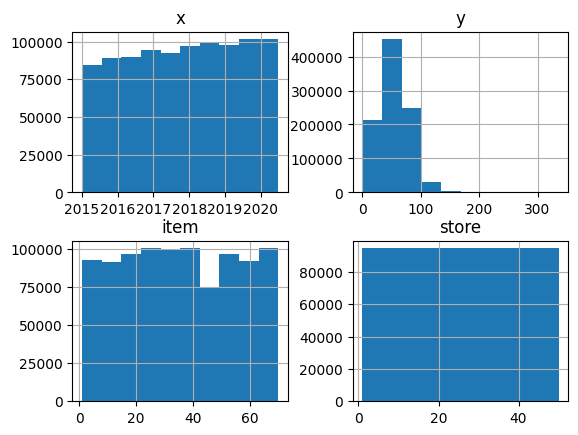

In [15]:
df.hist()

### TOTAL DE VALORES UNICOS EM CADA VARIAVEL

In [16]:
valores_unicos = []
for i in df.columns[0:12].tolist():
    print(i, ':', len(df[i].astype(str).value_counts()))
    valores_unicos.append(len(df[i].astype(str).value_counts()))

x : 287
y : 802733
item : 70
store : 50


### VERIFICANDO SE HÁ POSSIBILIDADE DE OUTLIERS E TRATAMENTO DO MESMO

y : float64
item : int64
store : int64


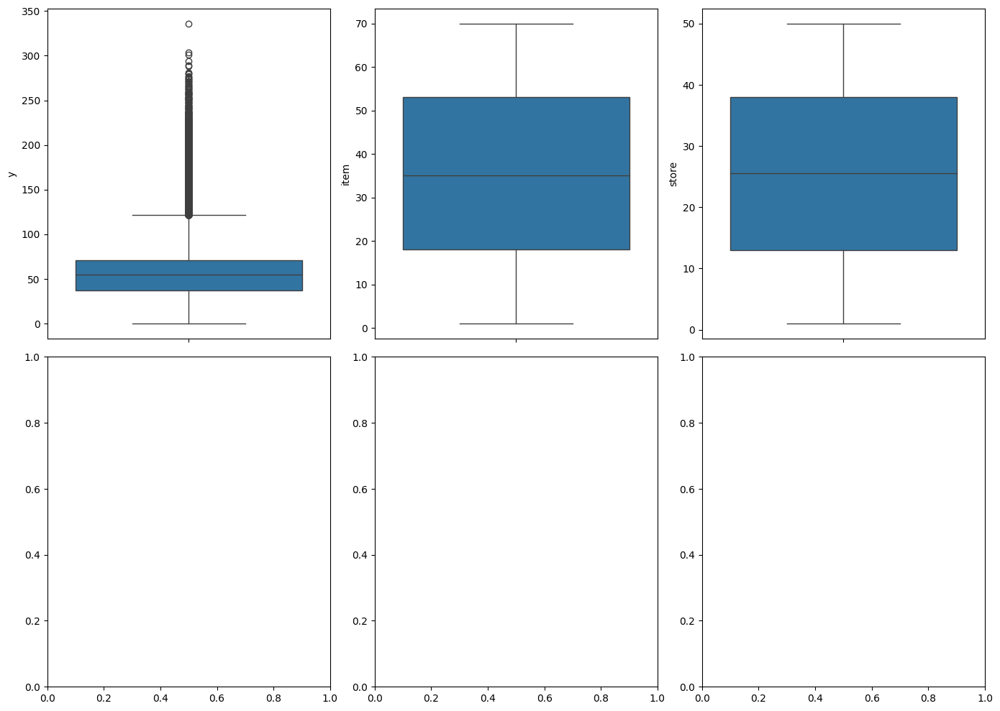

In [17]:
variaveis_numericas = []
for i in df.columns[0:16].tolist():
        if df.dtypes[i] == 'int64' or df.dtypes[i] == 'float64':            
            print(i, ':' , df.dtypes[i]) 
            variaveis_numericas.append(i)
 
    
    
    
plt.rcParams["figure.figsize"] = [14.00, 10.00]
plt.rcParams["figure.autolayout"] = True

plt.rcParams['font.size'] = 10 
plt.rcParams['axes.titlesize'] = 20

f, axes = plt.subplots(2, 3) #8 linhas e 4 colunas

linha = 0
coluna = 0
for i in variaveis_numericas:
    sns.boxplot(data = df, y=i, ax=axes[linha][coluna])
    coluna += 1
    if coluna == 3:
        linha += 1
        coluna = 0            

plt.show() 

### VERIFICANDO AS POSSIVEIS CORRELAÇÃO

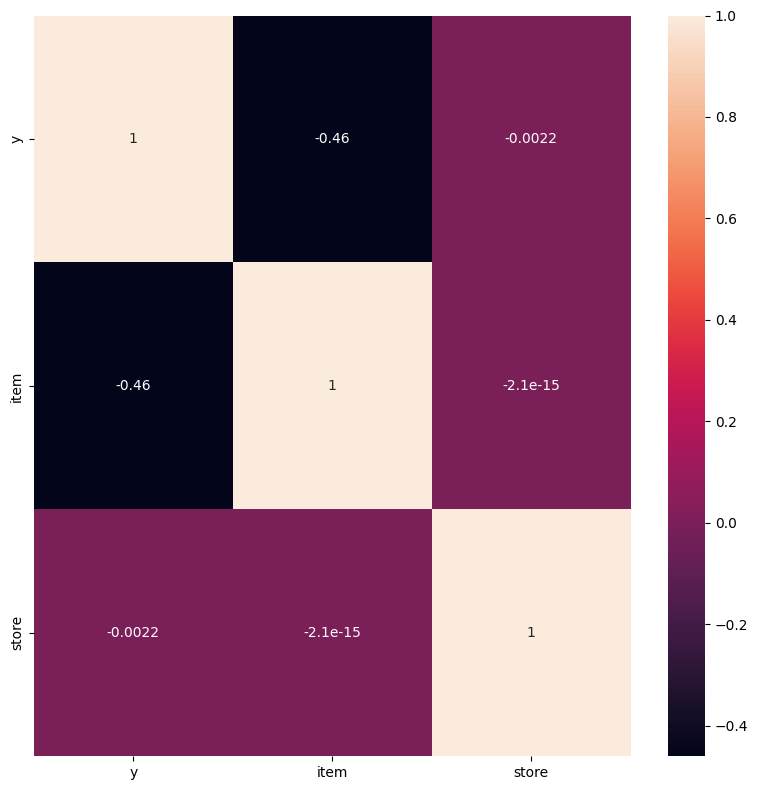

In [18]:
df_numeric = df.select_dtypes(include=['float64', 'int64'])

plt.rcParams['xtick.labelsize'] = 10
plt.rcParams['ytick.labelsize'] = 10
plt.rcParams['font.size'] = 10
plt.rcParams['axes.titlesize'] = 20
plt.rcParams["figure.figsize"] = [8.00, 8.00]
plt.rcParams["figure.autolayout"] = True


sns.heatmap(df_numeric.corr(), annot=True)
plt.show()

# ANÁLISE DE DADOS

## AGRUPAMENTO AS 5 LOJAS E OS 5 PRODUTOS

In [19]:
df.groupby(["item"]).size().sort_values(ascending=False).head(5)

item
1     14350
32    14350
34    14350
35    14350
2     14350
dtype: int64

In [20]:
df.groupby(["store"]).size().sort_values(ascending=False).head(5)

store
1     18930
38    18930
28    18930
29    18930
30    18930
dtype: int64

### SEGMENTANDO AS 5 LOJAS QUE MAIS OBTEVE VENDAS PARA INICIAR A SÉRIES TEMPORAIS E ANÁLISE

### LOJA 1

In [21]:
loja1 = df.loc[df['store'] == 1]
loja1.head()

,x,y,item,store
0,2015-01-04,51.922151,1,1
1,2015-01-11,39.768148,1,1
2,2015-01-18,24.558860,1,1
3,2015-01-25,40.584438,1,1
4,2015-02-01,15.148615,1,1


### ANALISANDO O LUCRO TOTAL EM CADA ANO DA LOJA 1

### 2015, 2016 e 2017

<Axes: xlabel='x'>

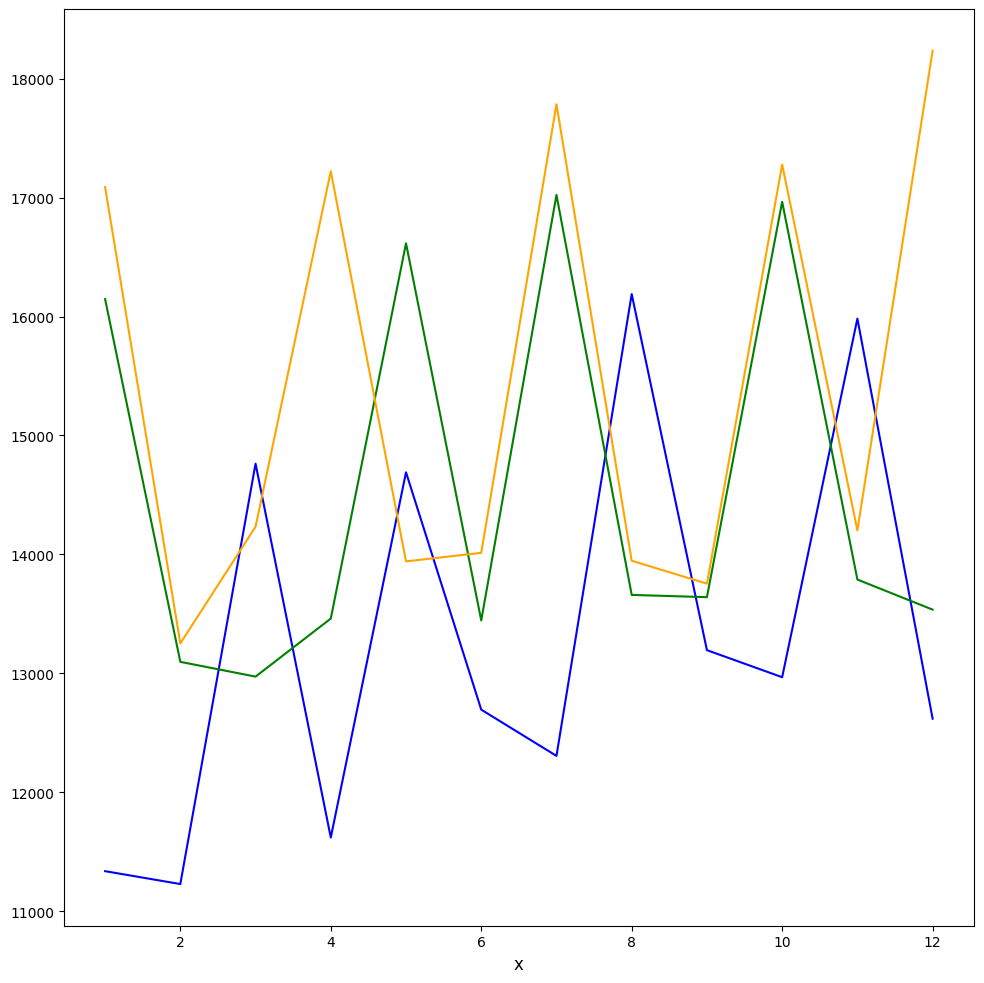

In [22]:
from importlib import reload
plt = reload(plt)

# Formatando tamanho do gráfico
plt.rcParams["figure.figsize"] = [10.00, 10.00]
plt.rcParams['font.size'] = 12
plt.rcParams['axes.titlesize'] = 20

# Convertendo o campo DATA_VENDA para DateTime
loja1['x'] = pd.to_datetime(loja1['x'], format="%d/%m/%Y")

df_2015 = loja1[loja1["x"].dt.year == 2015]
df_2016 = loja1[loja1["x"].dt.year == 2016]
df_2017 = loja1[loja1["x"].dt.year == 2017]


# Comparativo de lucro bruto por mês
df_2015.groupby(df_2015["x"].dt.month)["y"].sum().plot(color='blue', label='Ano 2015')
df_2016.groupby(df_2016["x"].dt.month)["y"].sum().plot(color='green', label='Ano 2016')
df_2017.groupby(df_2017["x"].dt.month)["y"].sum().plot(color='orange', label='Ano 2017')

In [23]:
(df_2015.groupby(df_2015["x"].dt.strftime('%m-%Y')).agg({"y": "sum"}).style.format("{:,.2f}"))

,y
x,
01-2015,"11,335.35"
02-2015,"11,226.90"
03-2015,"14,762.88"
04-2015,"11,618.26"
05-2015,"14,689.79"
06-2015,"12,693.79"
07-2015,"12,304.94"
08-2015,"16,189.11"
09-2015,"13,194.18"


In [24]:
(df_2016.groupby(df_2016["x"].dt.strftime('%m-%Y')).agg({"y": "sum"}).style.format("{:,.2f}"))

,y
x,
01-2016,"16,146.71"
02-2016,"13,095.87"
03-2016,"12,971.69"
04-2016,"13,460.03"
05-2016,"16,616.07"
06-2016,"13,443.93"
07-2016,"17,023.13"
08-2016,"13,658.87"
09-2016,"13,639.89"


In [25]:
(df_2017.groupby(df_2017["x"].dt.strftime('%m-%Y')).agg({"y": "sum"}).style.format("{:,.2f}"))

,y
x,
01-2017,"17,089.20"
02-2017,"13,250.79"
03-2017,"14,232.49"
04-2017,"17,222.18"
05-2017,"13,940.89"
06-2017,"14,012.76"
07-2017,"17,785.65"
08-2017,"13,946.19"
09-2017,"13,753.47"


### 2018, 2019 E 2020

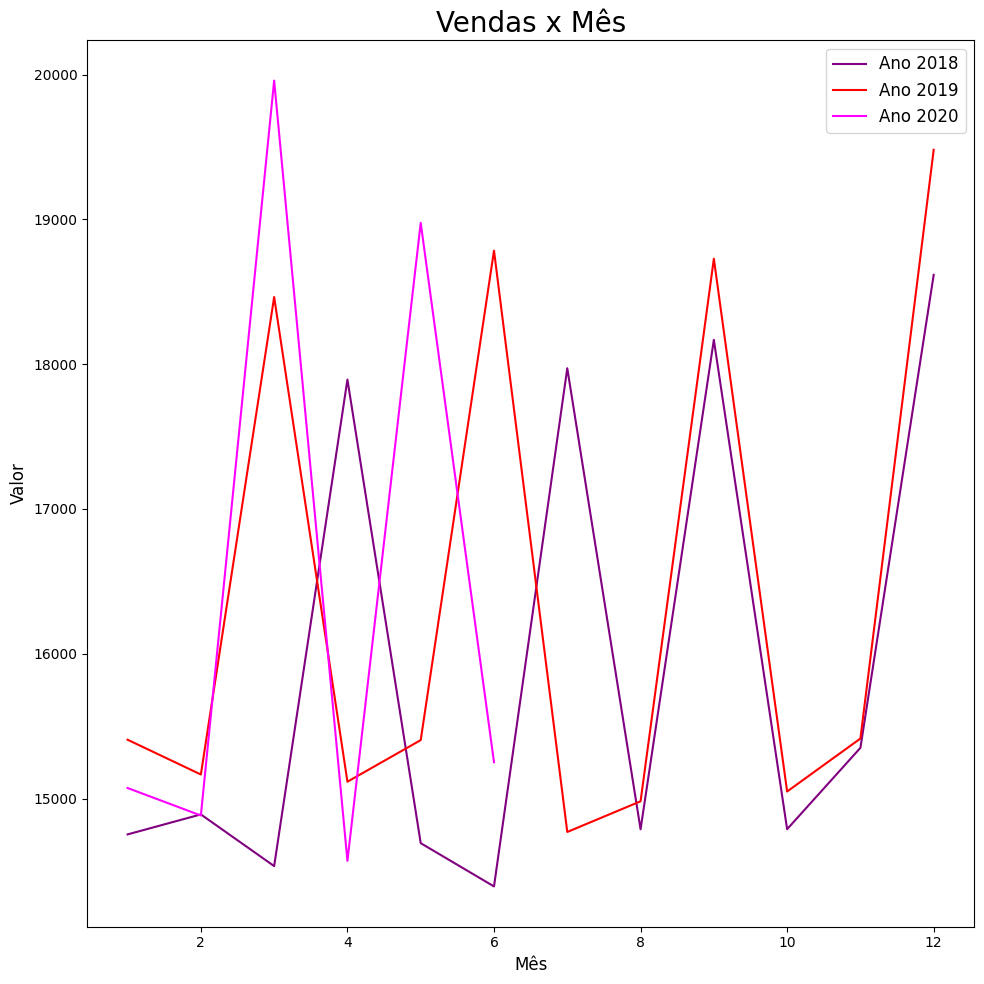

In [26]:
import matplotlib.pyplot as plt
from importlib import reload
plt = reload(plt)

df_2018 = loja1[loja1["x"].dt.year == 2018]
df_2019 = loja1[loja1["x"].dt.year == 2019]
df_2020 = loja1[loja1["x"].dt.year == 2020]

df_2018.groupby(df_2018["x"].dt.month)["y"].sum().plot(color='purple', label='Ano 2018')
df_2019.groupby(df_2019["x"].dt.month)["y"].sum().plot(color='red', label='Ano 2019')
df_2020.groupby(df_2020["x"].dt.month)["y"].sum().plot(color='magenta', label='Ano 2020')

plt.title("Vendas x Mês")
plt.ylabel("Valor")
plt.xlabel("Mês")

plt.legend()
plt.show()



In [27]:
(df_2018.groupby(df_2018["x"].dt.strftime('%m-%Y')).agg({"y": "sum"}).style.format("{:,.2f}"))

,y
x,
01-2018,"14,752.23"
02-2018,"14,890.26"
03-2018,"14,533.33"
04-2018,"17,893.68"
05-2018,"14,691.73"
06-2018,"14,392.83"
07-2018,"17,972.06"
08-2018,"14,787.36"
09-2018,"18,168.07"


In [28]:
(df_2019.groupby(df_2019["x"].dt.strftime('%m-%Y')).agg({"y": "sum"}).style.format("{:,.2f}"))

,y
x,
01-2019,"15,406.17"
02-2019,"15,165.94"
03-2019,"18,463.80"
04-2019,"15,116.17"
05-2019,"15,403.55"
06-2019,"18,784.25"
07-2019,"14,769.00"
08-2019,"14,980.84"
09-2019,"18,728.26"


In [29]:
(df_2020.groupby(df_2020["x"].dt.strftime('%m-%Y')).agg({"y": "sum"}).style.format("{:,.2f}"))

,y
x,
01-2020,"15,072.67"
02-2020,"14,882.78"
03-2020,"19,958.70"
04-2020,"14,569.32"
05-2020,"18,976.50"
06-2020,"15,250.90"


### LOJA 28

In [30]:
loja28 = df.loc[df['store'] == 28]
loja28.head()

,x,y,item,store
7749,2015-01-04,43.214959,1,28
7750,2015-01-11,49.728269,1,28
7751,2015-01-18,52.349848,1,28
7752,2015-01-25,34.104930,1,28
7753,2015-02-01,29.370249,1,28


### ANALISANDO O LUCRO TOTAL EM CADA ANO DA LOJA 28

### 2015, 2016 e 2017

<Axes: xlabel='x'>

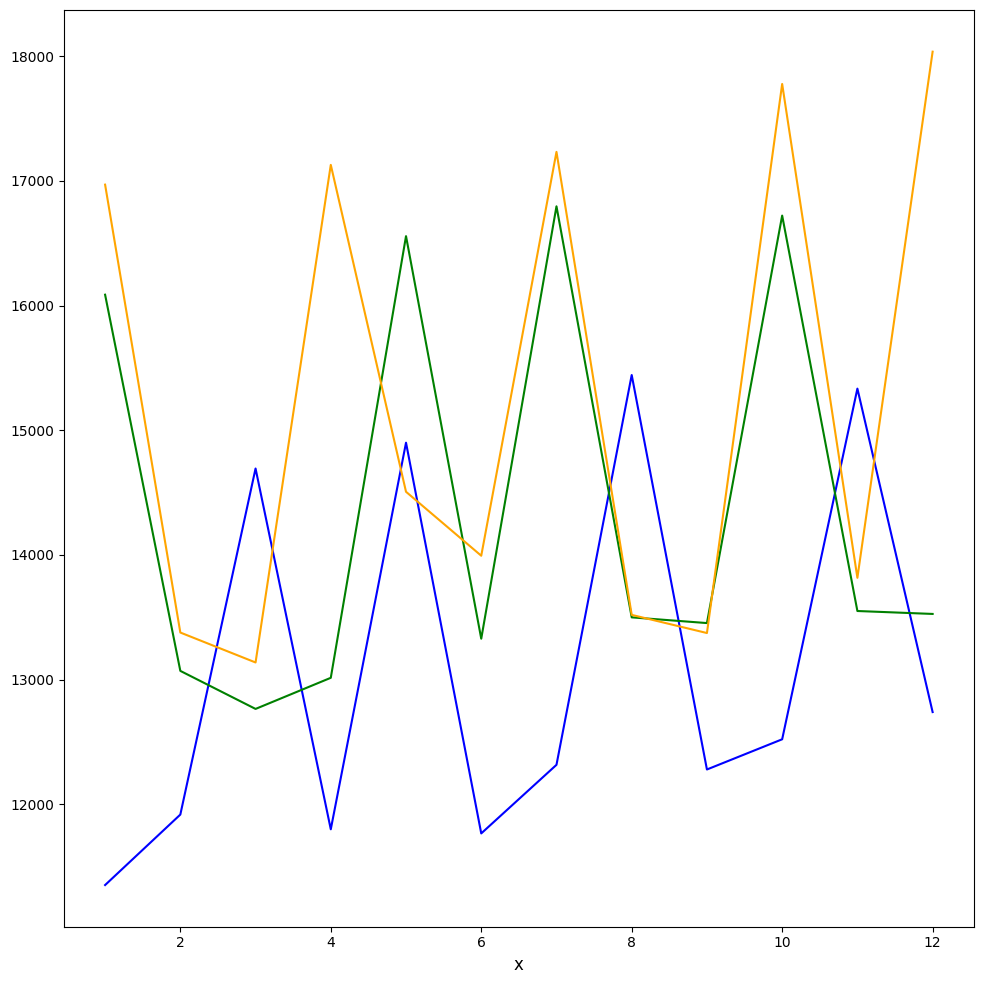

In [31]:
from importlib import reload
plt = reload(plt)

# Formatando tamanho do gráfico
plt.rcParams["figure.figsize"] = [10.00, 10.00]
plt.rcParams['font.size'] = 12
plt.rcParams['axes.titlesize'] = 20

# Convertendo o campo DATA_VENDA para DateTime
loja28['x'] = pd.to_datetime(loja28['x'], format="%d/%m/%Y")

df_2015_28 = loja28[loja28["x"].dt.year == 2015]
df_2016_28 = loja28[loja28["x"].dt.year == 2016]
df_2017_28 = loja28[loja28["x"].dt.year == 2017]


# Comparativo de lucro bruto por mês
df_2015_28.groupby(df_2015_28["x"].dt.month)["y"].sum().plot(color='blue', label='Ano 2015')
df_2016_28.groupby(df_2016_28["x"].dt.month)["y"].sum().plot(color='green', label='Ano 2016')
df_2017_28.groupby(df_2017_28["x"].dt.month)["y"].sum().plot(color='orange', label='Ano 2017')

In [32]:
(df_2015_28.groupby(df_2015_28["x"].dt.strftime('%m-%Y')).agg({"y": "sum"}).style.format("{:,.2f}"))

,y
x,
01-2015,"11,351.00"
02-2015,"11,916.46"
03-2015,"14,692.74"
04-2015,"11,798.18"
05-2015,"14,900.04"
06-2015,"11,765.28"
07-2015,"12,315.53"
08-2015,"15,442.86"
09-2015,"12,278.13"


In [33]:
(df_2016_28.groupby(df_2016_28["x"].dt.strftime('%m-%Y')).agg({"y": "sum"}).style.format("{:,.2f}"))

,y
x,
01-2016,"16,087.24"
02-2016,"13,069.21"
03-2016,"12,764.03"
04-2016,"13,013.69"
05-2016,"16,557.03"
06-2016,"13,327.28"
07-2016,"16,796.38"
08-2016,"13,498.64"
09-2016,"13,452.77"


In [34]:
(df_2017_28.groupby(df_2017_28["x"].dt.strftime('%m-%Y')).agg({"y": "sum"}).style.format("{:,.2f}"))

,y
x,
01-2017,"16,970.21"
02-2017,"13,376.90"
03-2017,"13,136.68"
04-2017,"17,128.82"
05-2017,"14,506.15"
06-2017,"13,993.02"
07-2017,"17,233.18"
08-2017,"13,518.48"
09-2017,"13,372.86"


### 2018, 2019 E 2020

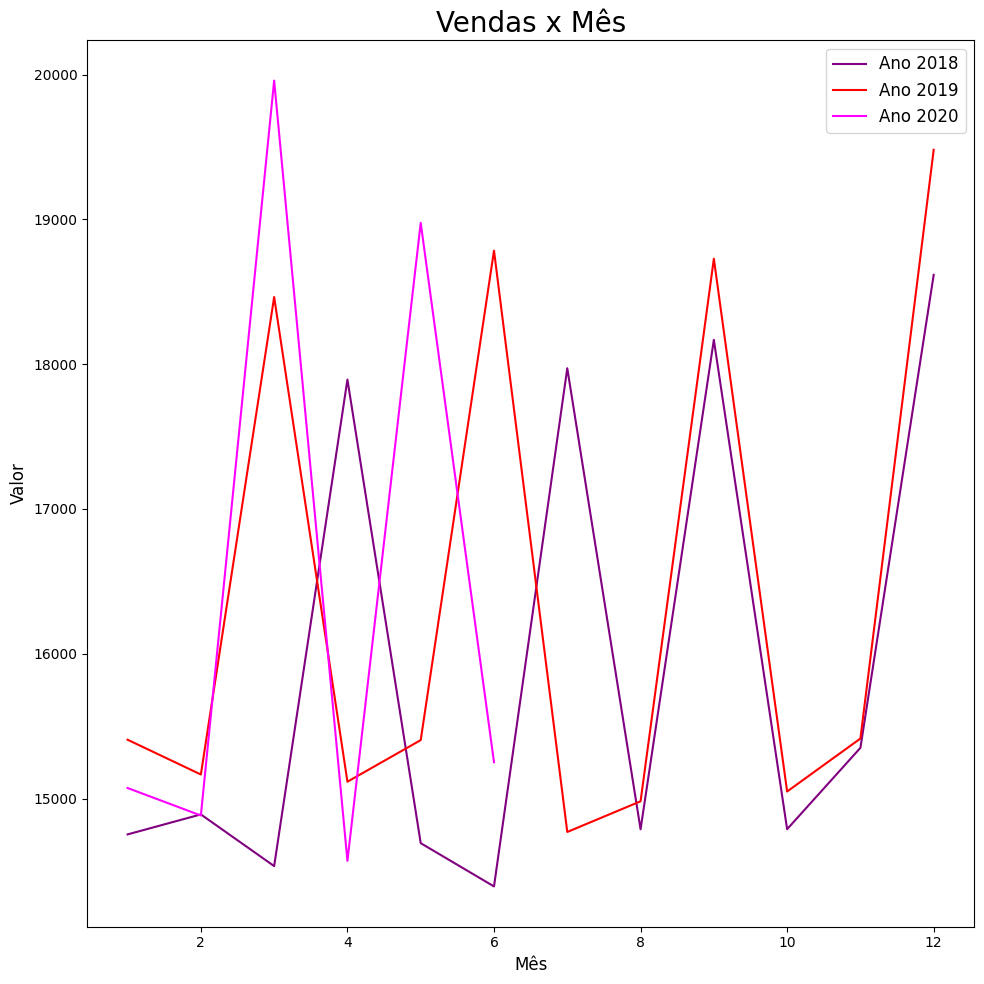

In [35]:
import matplotlib.pyplot as plt
from importlib import reload
plt = reload(plt)

df_2018_28 = loja1[loja1["x"].dt.year == 2018]
df_2019_28 = loja1[loja1["x"].dt.year == 2019]
df_2020_28 = loja1[loja1["x"].dt.year == 2020]

df_2018_28.groupby(df_2018_28["x"].dt.month)["y"].sum().plot(color='purple', label='Ano 2018')
df_2019_28.groupby(df_2019_28["x"].dt.month)["y"].sum().plot(color='red', label='Ano 2019')
df_2020_28.groupby(df_2020_28["x"].dt.month)["y"].sum().plot(color='magenta', label='Ano 2020')

plt.title("Vendas x Mês")
plt.ylabel("Valor")
plt.xlabel("Mês")

plt.legend()
plt.show()

In [36]:
(df_2018_28.groupby(df_2018_28["x"].dt.strftime('%m-%Y')).agg({"y": "sum"}).style.format("{:,.2f}"))

,y
x,
01-2018,"14,752.23"
02-2018,"14,890.26"
03-2018,"14,533.33"
04-2018,"17,893.68"
05-2018,"14,691.73"
06-2018,"14,392.83"
07-2018,"17,972.06"
08-2018,"14,787.36"
09-2018,"18,168.07"


In [37]:
(df_2019_28.groupby(df_2019_28["x"].dt.strftime('%m-%Y')).agg({"y": "sum"}).style.format("{:,.2f}"))

,y
x,
01-2019,"15,406.17"
02-2019,"15,165.94"
03-2019,"18,463.80"
04-2019,"15,116.17"
05-2019,"15,403.55"
06-2019,"18,784.25"
07-2019,"14,769.00"
08-2019,"14,980.84"
09-2019,"18,728.26"


In [38]:
(df_2020_28.groupby(df_2020_28["x"].dt.strftime('%m-%Y')).agg({"y": "sum"}).style.format("{:,.2f}"))

,y
x,
01-2020,"15,072.67"
02-2020,"14,882.78"
03-2020,"19,958.70"
04-2020,"14,569.32"
05-2020,"18,976.50"
06-2020,"15,250.90"


### LOJA 29

In [39]:
loja29 = df.loc[df['store'] == 29]
loja29.head()

,x,y,item,store
8036,2015-01-04,49.937851,1,29
8037,2015-01-11,45.401355,1,29
8038,2015-01-18,60.839637,1,29
8039,2015-01-25,38.856476,1,29
8040,2015-02-01,25.295571,1,29


### ANALISANDO O LUCRO TOTAL EM CADA ANO DA LOJA 29

### 2015, 2016 e 2017

<Axes: xlabel='x'>

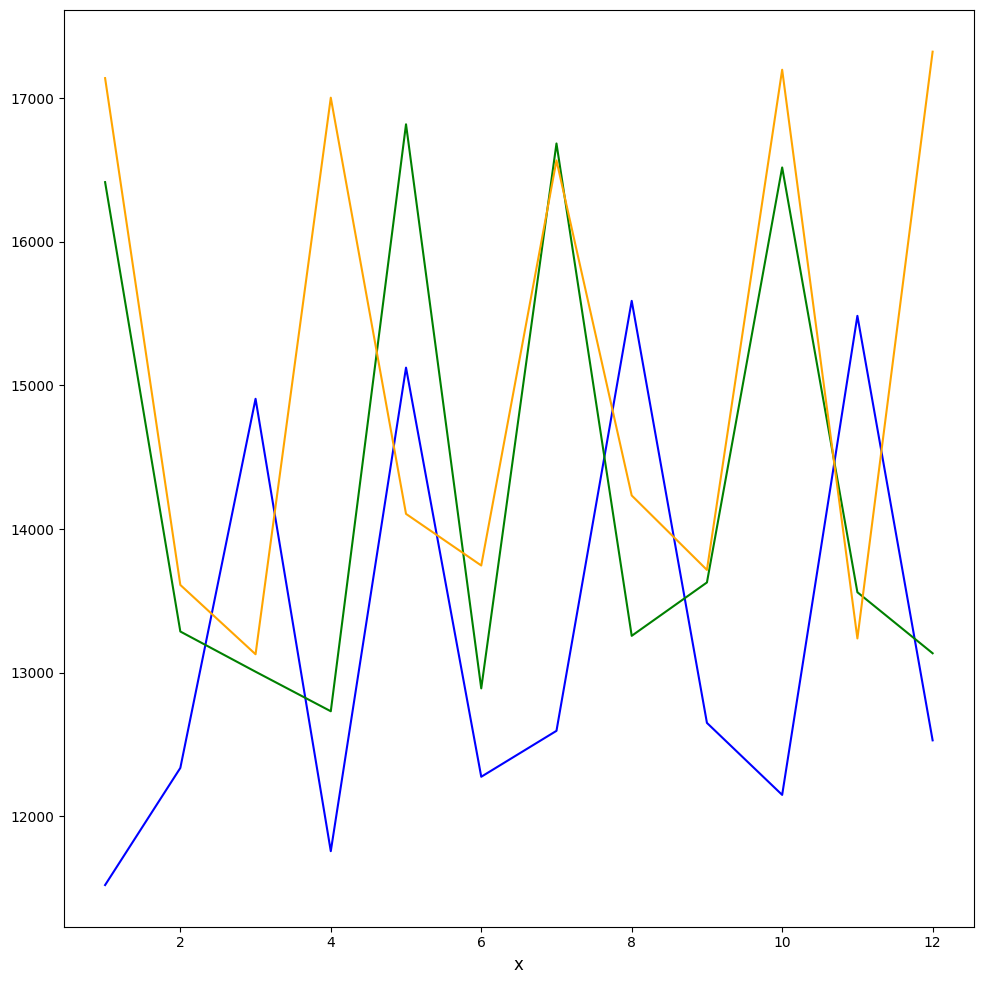

In [40]:
from importlib import reload
plt = reload(plt)

# Formatando tamanho do gráfico
plt.rcParams["figure.figsize"] = [10.00, 10.00]
plt.rcParams['font.size'] = 12
plt.rcParams['axes.titlesize'] = 20

# Convertendo o campo DATA_VENDA para DateTime
loja29['x'] = pd.to_datetime(loja29['x'], format="%d/%m/%Y")

df_2015_29 = loja29[loja29["x"].dt.year == 2015]
df_2016_29 = loja29[loja29["x"].dt.year == 2016]
df_2017_29 = loja29[loja29["x"].dt.year == 2017]


# Comparativo de lucro bruto por mês
df_2015_29.groupby(df_2015_29["x"].dt.month)["y"].sum().plot(color='blue', label='Ano 2015')
df_2016_29.groupby(df_2016_29["x"].dt.month)["y"].sum().plot(color='green', label='Ano 2016')
df_2017_29.groupby(df_2017_29["x"].dt.month)["y"].sum().plot(color='orange', label='Ano 2017')

In [41]:
(df_2015_29.groupby(df_2015_29["x"].dt.strftime('%m-%Y')).agg({"y": "sum"}).style.format("{:,.2f}"))

,y
x,
01-2015,"11,521.55"
02-2015,"12,336.88"
03-2015,"14,906.62"
04-2015,"11,757.44"
05-2015,"15,123.41"
06-2015,"12,275.43"
07-2015,"12,595.14"
08-2015,"15,588.58"
09-2015,"12,650.41"


In [42]:
(df_2016_29.groupby(df_2016_29["x"].dt.strftime('%m-%Y')).agg({"y": "sum"}).style.format("{:,.2f}"))

,y
x,
01-2016,"16,414.88"
02-2016,"13,286.57"
03-2016,"13,006.70"
04-2016,"12,731.35"
05-2016,"16,817.46"
06-2016,"12,890.60"
07-2016,"16,683.96"
08-2016,"13,256.45"
09-2016,"13,628.02"


In [43]:
(df_2017_29.groupby(df_2017_29["x"].dt.strftime('%m-%Y')).agg({"y": "sum"}).style.format("{:,.2f}"))

,y
x,
01-2017,"17,138.93"
02-2017,"13,610.80"
03-2017,"13,128.26"
04-2017,"17,002.71"
05-2017,"14,105.45"
06-2017,"13,746.07"
07-2017,"16,566.08"
08-2017,"14,233.62"
09-2017,"13,715.28"


### 2018, 2019 E 2020

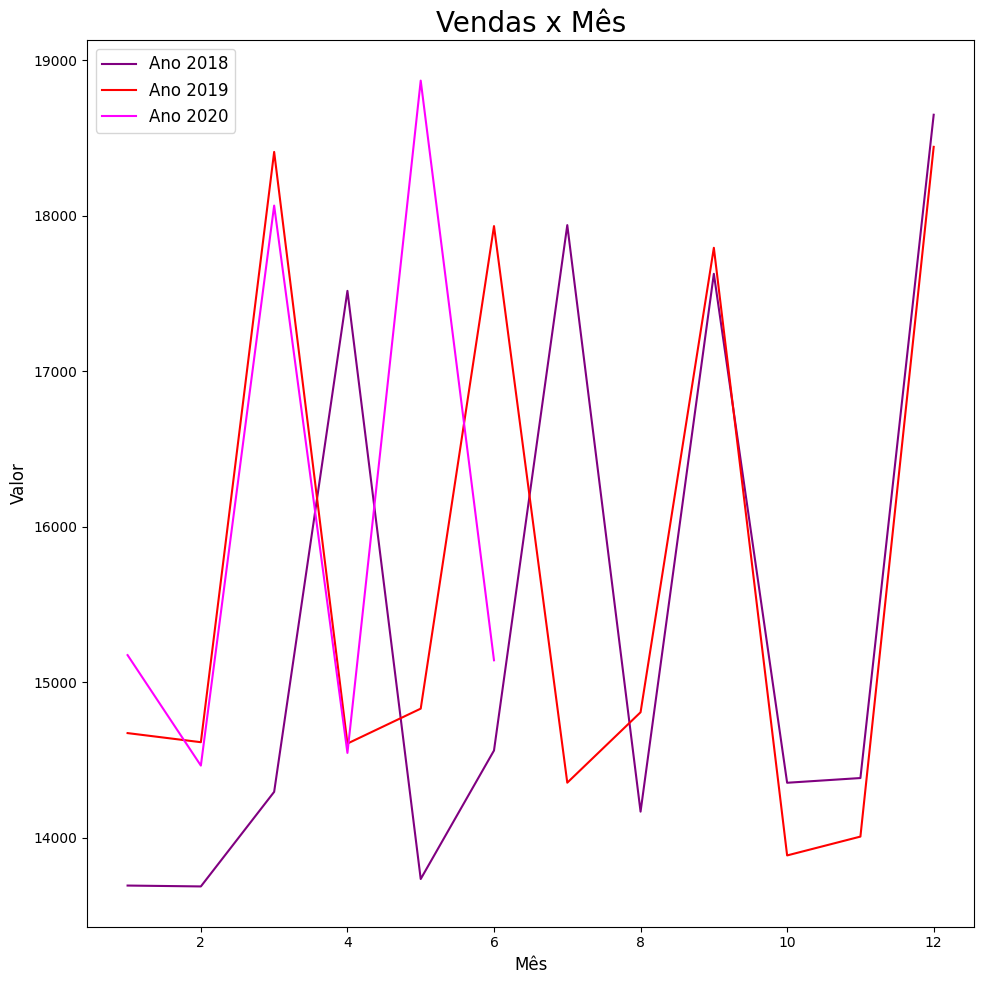

In [44]:
import matplotlib.pyplot as plt
from importlib import reload
plt = reload(plt)

df_2018_29 = loja29[loja29["x"].dt.year == 2018]
df_2019_29 = loja29[loja29["x"].dt.year == 2019]
df_2020_29 = loja29[loja29["x"].dt.year == 2020]

df_2018_29.groupby(df_2018_29["x"].dt.month)["y"].sum().plot(color='purple', label='Ano 2018')
df_2019_29.groupby(df_2019_29["x"].dt.month)["y"].sum().plot(color='red', label='Ano 2019')
df_2020_29.groupby(df_2020_29["x"].dt.month)["y"].sum().plot(color='magenta', label='Ano 2020')

plt.title("Vendas x Mês")
plt.ylabel("Valor")
plt.xlabel("Mês")

plt.legend()
plt.show()

In [45]:
(df_2018_29.groupby(df_2018_29["x"].dt.strftime('%m-%Y')).agg({"y": "sum"}).style.format("{:,.2f}"))

,y
x,
01-2018,"13,691.23"
02-2018,"13,685.58"
03-2018,"14,293.83"
04-2018,"17,516.38"
05-2018,"13,733.33"
06-2018,"14,559.90"
07-2018,"17,939.20"
08-2018,"14,166.62"
09-2018,"17,626.06"


In [46]:
(df_2019_29.groupby(df_2019_29["x"].dt.strftime('%m-%Y')).agg({"y": "sum"}).style.format("{:,.2f}"))

,y
x,
01-2019,"14,671.85"
02-2019,"14,613.32"
03-2019,"18,410.04"
04-2019,"14,604.60"
05-2019,"14,829.17"
06-2019,"17,932.94"
07-2019,"14,352.87"
08-2019,"14,805.85"
09-2019,"17,793.37"


In [47]:
(df_2020_29.groupby(df_2020_29["x"].dt.strftime('%m-%Y')).agg({"y": "sum"}).style.format("{:,.2f}"))

,y
x,
01-2020,"15,173.45"
02-2020,"14,462.92"
03-2020,"18,064.85"
04-2020,"14,544.41"
05-2020,"18,868.66"
06-2020,"15,140.15"


### LOJA 30

In [48]:
loja30 = df.loc[df['store'] == 30]
loja30.head()

,x,y,item,store
8323,2015-01-04,75.733857,1,30
8324,2015-01-11,56.702188,1,30
8325,2015-01-18,74.554661,1,30
8326,2015-01-25,32.610433,1,30
8327,2015-02-01,35.149904,1,30


### ANALISANDO O LUCRO TOTAL EM CADA ANO DA LOJA 30

### 2015, 2016 e 2017

<Axes: xlabel='x'>

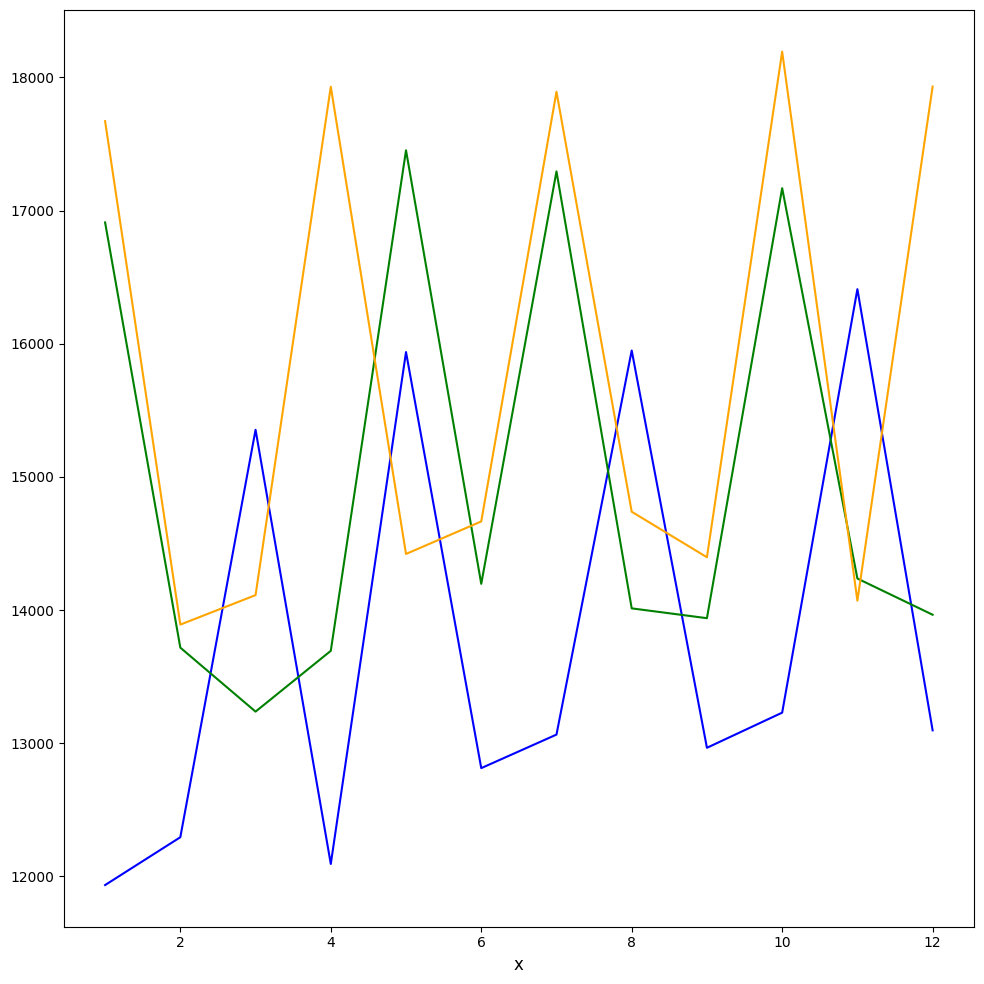

In [49]:
from importlib import reload
plt = reload(plt)

# Formatando tamanho do gráfico
plt.rcParams["figure.figsize"] = [10.00, 10.00]
plt.rcParams['font.size'] = 12
plt.rcParams['axes.titlesize'] = 20

# Convertendo o campo DATA_VENDA para DateTime
loja29['x'] = pd.to_datetime(loja29['x'], format="%d/%m/%Y")

df_2015_30 = loja30[loja30["x"].dt.year == 2015]
df_2016_30 = loja30[loja30["x"].dt.year == 2016]
df_2017_30 = loja30[loja30["x"].dt.year == 2017]


# Comparativo de lucro bruto por mês
df_2015_30.groupby(df_2015_30["x"].dt.month)["y"].sum().plot(color='blue', label='Ano 2015')
df_2016_30.groupby(df_2016_30["x"].dt.month)["y"].sum().plot(color='green', label='Ano 2016')
df_2017_30.groupby(df_2017_30["x"].dt.month)["y"].sum().plot(color='orange', label='Ano 2017')

In [50]:
(df_2015_30.groupby(df_2015_30["x"].dt.strftime('%m-%Y')).agg({"y": "sum"}).style.format("{:,.2f}"))

,y
x,
01-2015,"11,934.82"
02-2015,"12,293.97"
03-2015,"15,353.51"
04-2015,"12,093.35"
05-2015,"15,937.10"
06-2015,"12,812.84"
07-2015,"13,064.66"
08-2015,"15,948.97"
09-2015,"12,965.56"


In [51]:
(df_2016_30.groupby(df_2016_30["x"].dt.strftime('%m-%Y')).agg({"y": "sum"}).style.format("{:,.2f}"))

,y
x,
01-2016,"16,910.76"
02-2016,"13,717.66"
03-2016,"13,237.22"
04-2016,"13,693.65"
05-2016,"17,452.31"
06-2016,"14,196.60"
07-2016,"17,293.79"
08-2016,"14,012.51"
09-2016,"13,938.78"


In [52]:
(df_2017_30.groupby(df_2017_30["x"].dt.strftime('%m-%Y')).agg({"y": "sum"}).style.format("{:,.2f}"))

,y
x,
01-2017,"17,671.28"
02-2017,"13,890.56"
03-2017,"14,112.00"
04-2017,"17,929.77"
05-2017,"14,421.06"
06-2017,"14,665.31"
07-2017,"17,891.98"
08-2017,"14,738.12"
09-2017,"14,396.50"


### 2018, 2019 E 2020

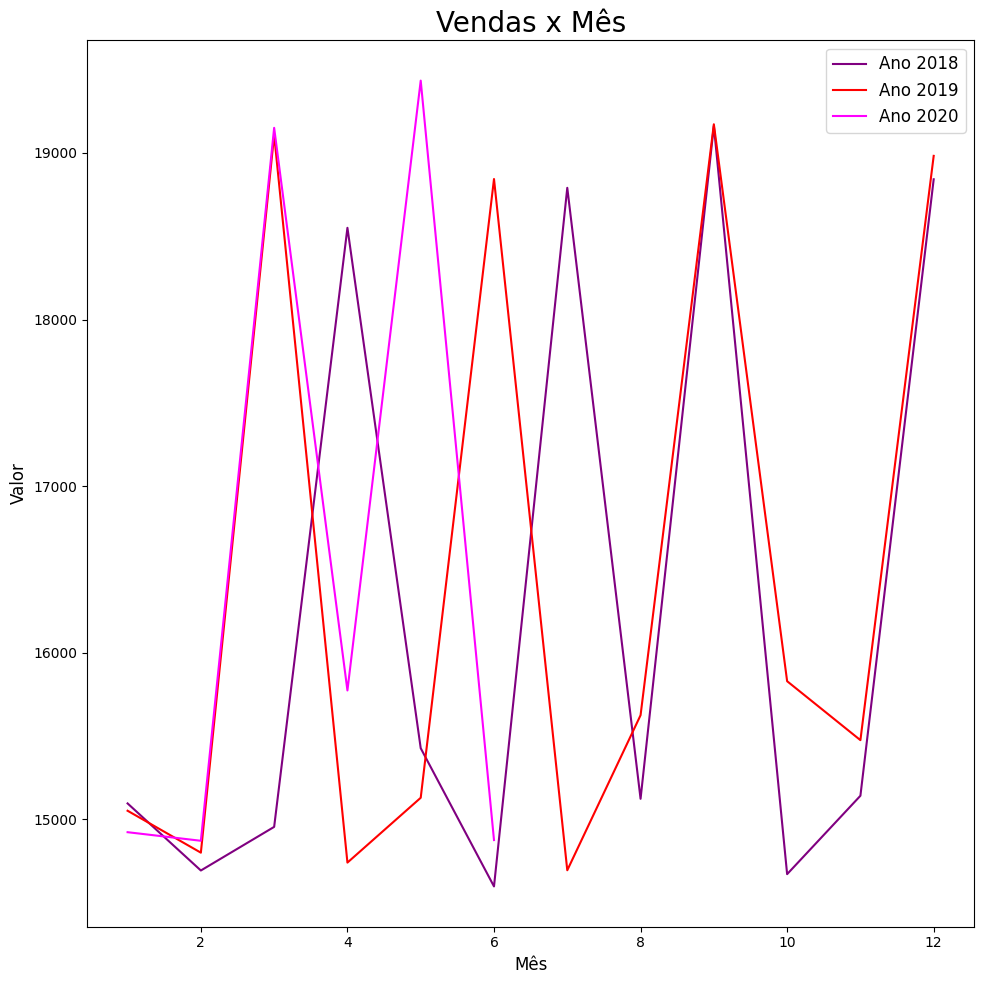

In [53]:
import matplotlib.pyplot as plt
from importlib import reload
plt = reload(plt)

loja30['x'] = pd.to_datetime(loja30['x'], format="%d/%m/%Y") 

df_2018_30 = loja30[loja30["x"].dt.year == 2018]
df_2019_30 = loja30[loja30["x"].dt.year == 2019]
df_2020_30 = loja30[loja30["x"].dt.year == 2020]

df_2018_30.groupby(df_2018_30["x"].dt.month)["y"].sum().plot(color='purple', label='Ano 2018')
df_2019_30.groupby(df_2019_30["x"].dt.month)["y"].sum().plot(color='red', label='Ano 2019')
df_2020_30.groupby(df_2020_30["x"].dt.month)["y"].sum().plot(color='magenta', label='Ano 2020')

plt.title("Vendas x Mês")
plt.ylabel("Valor")
plt.xlabel("Mês")

plt.legend()
plt.show()

In [54]:
(df_2018_30.groupby(df_2018_30["x"].dt.strftime('%m-%Y')).agg({"y": "sum"}).style.format("{:,.2f}"))

,y
x,
01-2018,"15,096.09"
02-2018,"14,693.53"
03-2018,"14,955.31"
04-2018,"18,550.41"
05-2018,"15,427.54"
06-2018,"14,597.94"
07-2018,"18,790.46"
08-2018,"15,123.83"
09-2018,"19,162.02"


In [55]:
(df_2019_30.groupby(df_2019_30["x"].dt.strftime('%m-%Y')).agg({"y": "sum"}).style.format("{:,.2f}"))

,y
x,
01-2019,"15,052.19"
02-2019,"14,800.52"
03-2019,"19,108.06"
04-2019,"14,740.97"
05-2019,"15,130.02"
06-2019,"18,843.24"
07-2019,"14,694.94"
08-2019,"15,625.38"
09-2019,"19,171.75"


In [56]:
(df_2020_30.groupby(df_2020_30["x"].dt.strftime('%m-%Y')).agg({"y": "sum"}).style.format("{:,.2f}"))

,y
x,
01-2020,"14,923.43"
02-2020,"14,871.91"
03-2020,"19,150.40"
04-2020,"15,774.03"
05-2020,"19,433.74"
06-2020,"14,876.17"


### LOJA 38

In [57]:
loja38 = df.loc[df['store'] == 38]
loja38.head()

,x,y,item,store
10619,2015-01-04,61.622919,1,38
10620,2015-01-11,55.933277,1,38
10621,2015-01-18,54.497312,1,38
10622,2015-01-25,68.181425,1,38
10623,2015-02-01,52.722551,1,38


### ANALISANDO O LUCRO TOTAL EM CADA ANO DA LOJA 38

### 2015, 2016 e 2017

In [58]:
loja38 = df.loc[df['store'] == 38]
loja38.head()

,x,y,item,store
10619,2015-01-04,61.622919,1,38
10620,2015-01-11,55.933277,1,38
10621,2015-01-18,54.497312,1,38
10622,2015-01-25,68.181425,1,38
10623,2015-02-01,52.722551,1,38


<Axes: xlabel='x'>

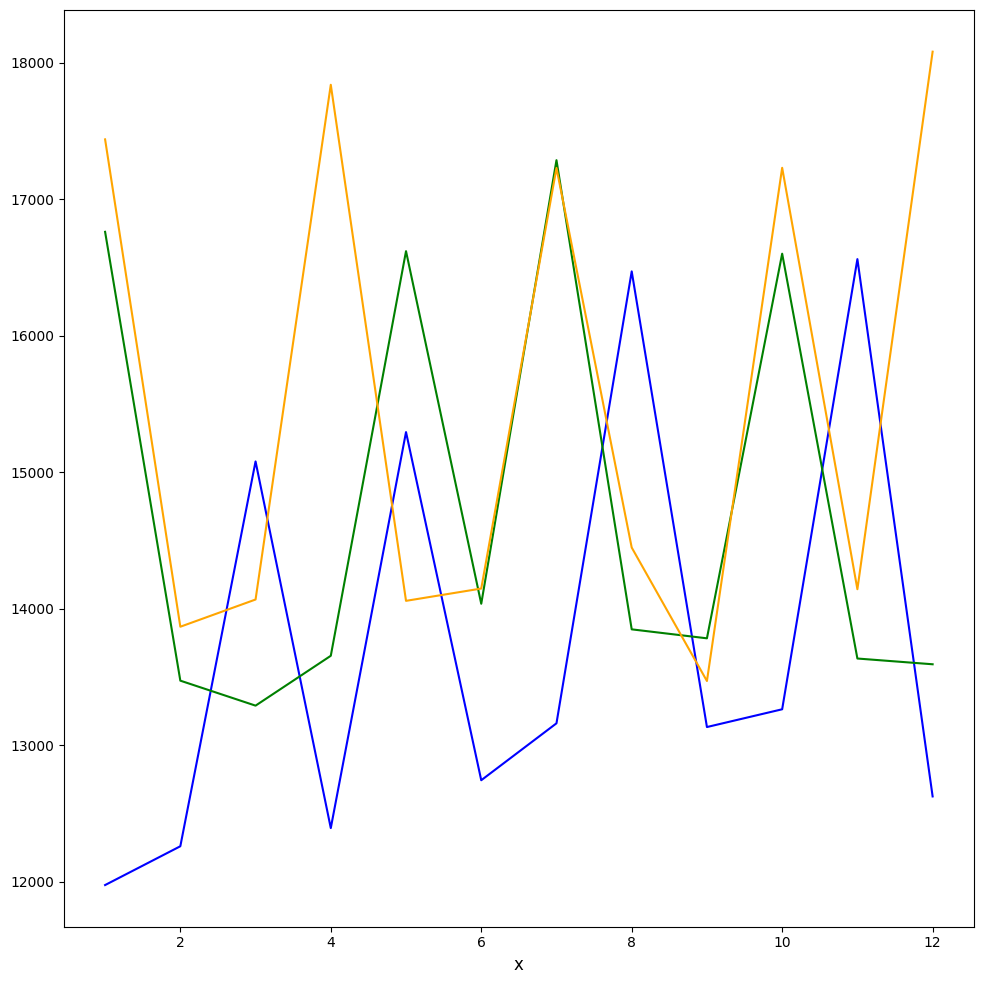

In [59]:
from importlib import reload
plt = reload(plt)

# Formatando tamanho do gráfico
plt.rcParams["figure.figsize"] = [10.00, 10.00]
plt.rcParams['font.size'] = 12
plt.rcParams['axes.titlesize'] = 20

# Convertendo o campo DATA_VENDA para DateTime
loja29['x'] = pd.to_datetime(loja29['x'], format="%d/%m/%Y")

df_2015_38 = loja38[loja38["x"].dt.year == 2015]
df_2016_38 = loja38[loja38["x"].dt.year == 2016]
df_2017_38 = loja38[loja38["x"].dt.year == 2017]


# Comparativo de lucro bruto por mês
df_2015_38.groupby(df_2015_38["x"].dt.month)["y"].sum().plot(color='blue', label='Ano 2015')
df_2016_38.groupby(df_2016_38["x"].dt.month)["y"].sum().plot(color='green', label='Ano 2016')
df_2017_38.groupby(df_2017_38["x"].dt.month)["y"].sum().plot(color='orange', label='Ano 2017')

In [60]:
(df_2015_38.groupby(df_2015_38["x"].dt.strftime('%m-%Y')).agg({"y": "sum"}).style.format("{:,.2f}"))

,y
x,
01-2015,"11,975.88"
02-2015,"12,260.05"
03-2015,"15,078.38"
04-2015,"12,392.97"
05-2015,"15,293.33"
06-2015,"12,743.57"
07-2015,"13,160.46"
08-2015,"16,470.13"
09-2015,"13,133.14"


In [61]:
(df_2016_38.groupby(df_2016_38["x"].dt.strftime('%m-%Y')).agg({"y": "sum"}).style.format("{:,.2f}"))

,y
x,
01-2016,"16,759.93"
02-2016,"13,472.83"
03-2016,"13,289.87"
04-2016,"13,655.03"
05-2016,"16,618.43"
06-2016,"14,035.95"
07-2016,"17,284.62"
08-2016,"13,848.60"
09-2016,"13,782.89"


In [62]:
(df_2017_38.groupby(df_2017_38["x"].dt.strftime('%m-%Y')).agg({"y": "sum"}).style.format("{:,.2f}"))

,y
x,
01-2017,"17,437.15"
02-2017,"13,867.77"
03-2017,"14,067.08"
04-2017,"17,836.91"
05-2017,"14,057.36"
06-2017,"14,147.43"
07-2017,"17,227.61"
08-2017,"14,447.85"
09-2017,"13,470.22"


### 2018, 2019 E 2020

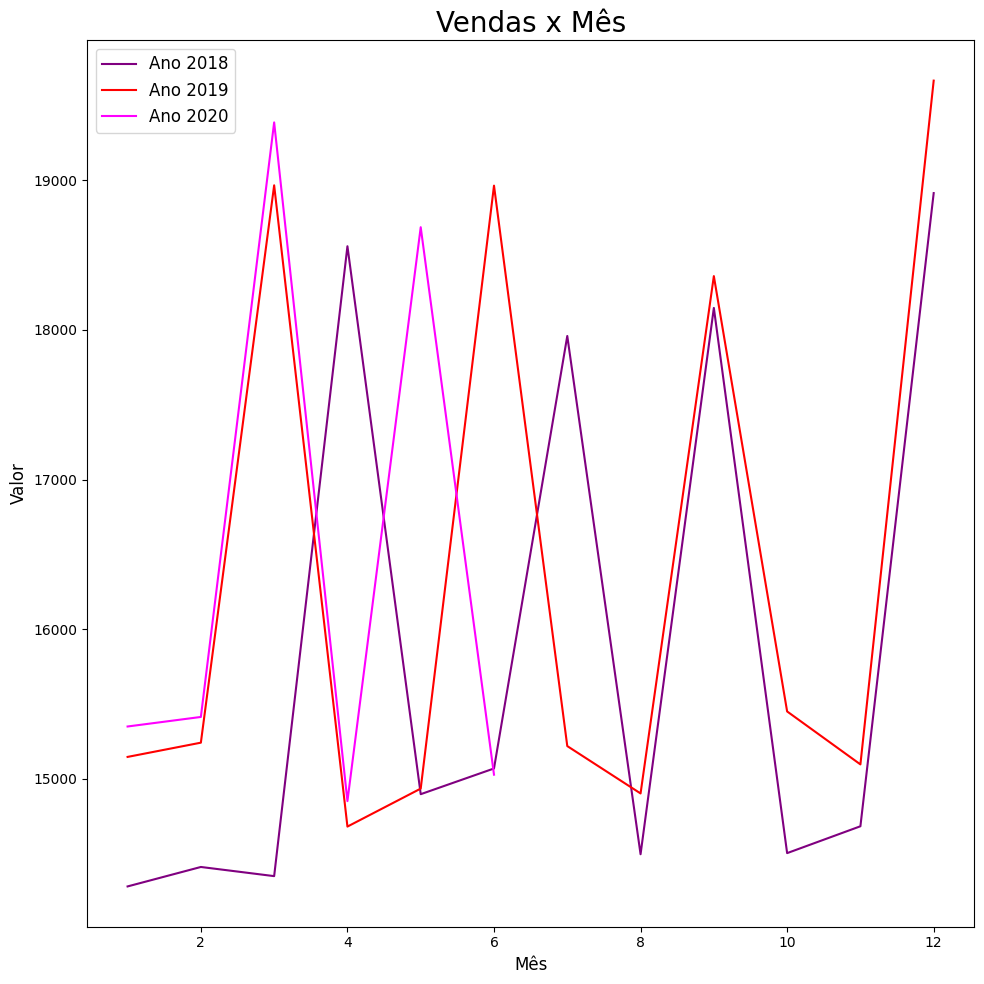

In [63]:
import matplotlib.pyplot as plt
from importlib import reload
plt = reload(plt)

loja38['x'] = pd.to_datetime(loja38['x'], format="%d/%m/%Y")

df_2018_38 = loja38[loja38["x"].dt.year == 2018]
df_2019_38 = loja38[loja38["x"].dt.year == 2019]
df_2020_38 = loja38[loja38["x"].dt.year == 2020]

df_2018_38.groupby(df_2018_38["x"].dt.month)["y"].sum().plot(color='purple', label='Ano 2018')
df_2019_38.groupby(df_2019_38["x"].dt.month)["y"].sum().plot(color='red', label='Ano 2019')
df_2020_38.groupby(df_2020_38["x"].dt.month)["y"].sum().plot(color='magenta', label='Ano 2020')

plt.title("Vendas x Mês")
plt.ylabel("Valor")
plt.xlabel("Mês")

plt.legend()
plt.show()

In [64]:
(df_2018_38.groupby(df_2018_38["x"].dt.strftime('%m-%Y')).agg({"y": "sum"}).style.format("{:,.2f}"))

,y
x,
01-2018,"14,280.53"
02-2018,"14,410.58"
03-2018,"14,349.38"
04-2018,"18,558.98"
05-2018,"14,897.01"
06-2018,"15,068.87"
07-2018,"17,959.20"
08-2018,"14,495.69"
09-2018,"18,146.70"


In [65]:
(df_2019_38.groupby(df_2019_38["x"].dt.strftime('%m-%Y')).agg({"y": "sum"}).style.format("{:,.2f}"))

,y
x,
01-2019,"15,146.09"
02-2019,"15,241.30"
03-2019,"18,966.21"
04-2019,"14,680.51"
05-2019,"14,934.42"
06-2019,"18,963.98"
07-2019,"15,218.47"
08-2019,"14,901.98"
09-2019,"18,359.29"


In [66]:
(df_2020_38.groupby(df_2020_38["x"].dt.strftime('%m-%Y')).agg({"y": "sum"}).style.format("{:,.2f}"))

,y
x,
01-2020,"15,349.39"
02-2020,"15,413.18"
03-2020,"19,386.65"
04-2020,"14,850.72"
05-2020,"18,686.16"
06-2020,"15,027.34"


In [67]:
df.head(1)

,x,y,item,store
0,2015-01-04,51.922151,1,1


### SEPARANDO A DATA PARA FAZER PREVISÃO

In [68]:
df_2020_df = df[df["x"].dt.year == 2020]

In [69]:
df_2020_df.head(1)

,x,y,item,store
261,2020-01-05,52.085029,1,1


# SÉRIE TEMPORAL

In [70]:
df_serie_tremporal = df_2020_df[['x','y']]

In [71]:
df_serie_tremporal.head()

,x,y
261,2020-01-05,52.085029
262,2020-01-12,33.423704
263,2020-01-19,30.279157
264,2020-01-26,34.008818
265,2020-02-02,32.873530


In [72]:
# Convertendo a coluna 'x' para o tipo datetime
df_serie_tremporal['x'] = pd.to_datetime(df_serie_tremporal['x'], format='%Y-%m-%d')

# Definindo a coluna 'x' como índice
df_serie_tremporal.set_index('x', inplace=True)

In [73]:
# Quando começam e terminam os dados?
df_serie_tremporal.index.min(), df_serie_tremporal.index.max()

(Timestamp('2020-01-05 00:00:00'), Timestamp('2020-06-28 00:00:00'))

In [74]:
df_serie_tremporal.shape

(91000, 1)

In [75]:
df_serie_tremporal.head()

,y
x,
2020-01-05,52.085029
2020-01-12,33.423704
2020-01-19,30.279157
2020-01-26,34.008818
2020-02-02,32.873530


In [76]:
df_serie_tremporal.tail(10)

,y
x,
2020-04-26,2.0
2020-05-03,0.0
2020-05-10,1.0
2020-05-17,0.0
2020-05-24,0.0
2020-05-31,0.0
2020-06-07,0.0
2020-06-14,0.0
2020-06-21,0.0


<Axes: xlabel='x'>

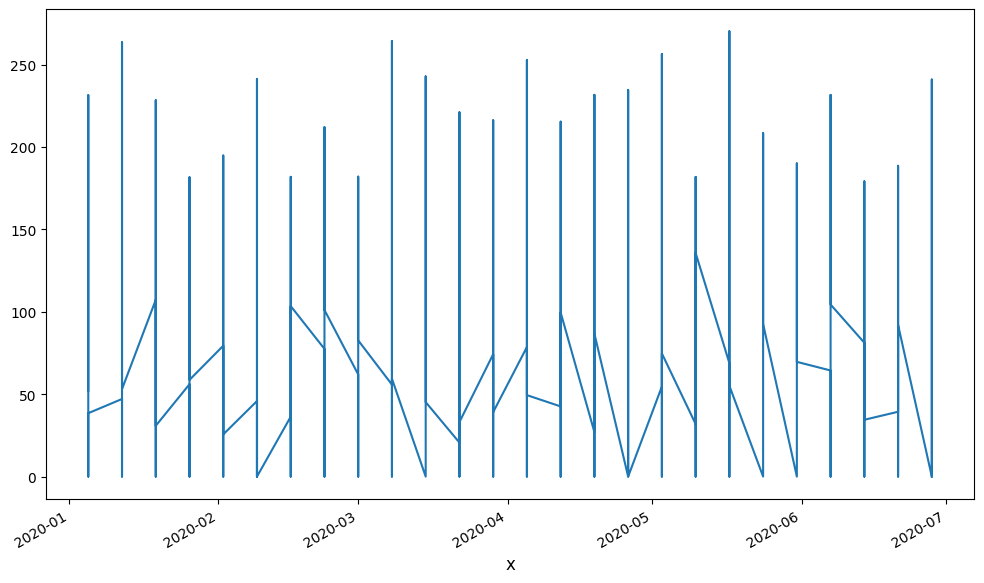

In [77]:
# Vamos dar uma olhada no gráfico de consumo x anos
df_serie_tremporal['y'].plot(figsize=(10,6))

# Prevendo com ARIMA

In [78]:
# Verifique o tipo de dados do índice antes da conversão
print(df_serie_tremporal.index)

# Converta para o formato de data
df_serie_tremporal.index = pd.to_datetime(df_serie_tremporal.index)

# Verifique novamente o tipo de dados após a conversão
print(df_serie_tremporal.index)


DatetimeIndex(['2020-01-05', '2020-01-12', '2020-01-19', '2020-01-26',
               '2020-02-02', '2020-02-09', '2020-02-16', '2020-02-23',
               '2020-03-01', '2020-03-08',
               ...
               '2020-04-26', '2020-05-03', '2020-05-10', '2020-05-17',
               '2020-05-24', '2020-05-31', '2020-06-07', '2020-06-14',
               '2020-06-21', '2020-06-28'],
              dtype='datetime64[ns]', name='x', length=91000, freq=None)
DatetimeIndex(['2020-01-05', '2020-01-12', '2020-01-19', '2020-01-26',
               '2020-02-02', '2020-02-09', '2020-02-16', '2020-02-23',
               '2020-03-01', '2020-03-08',
               ...
               '2020-04-26', '2020-05-03', '2020-05-10', '2020-05-17',
               '2020-05-24', '2020-05-31', '2020-06-07', '2020-06-14',
               '2020-06-21', '2020-06-28'],
              dtype='datetime64[ns]', name='x', length=91000, freq=None)


In [79]:
df_serie_tremporal.head(1)

,y
x,
2020-01-05,52.085029


In [80]:
df_serie_tremporal.shape

(91000, 1)

In [81]:
df_serie_tremporal.duplicated().sum()

13025

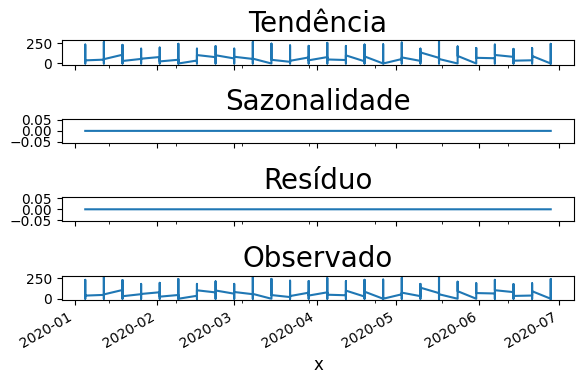

In [82]:
import pandas as pd
from statsmodels.tsa.seasonal import seasonal_decompose
import matplotlib.pyplot as plt

# Certifique-se de que o índice do seu DataFrame seja do tipo DatetimeIndex
df_serie_tremporal.index = pd.to_datetime(df_serie_tremporal.index)

# Decomposição sazonal aditiva
resultado = seasonal_decompose(df_serie_tremporal['y'], model='aditive', period=1)  # 'period' deve ser ajustado de acordo com a sazonalidade real dos seus dados

# Visualização dos resultados
fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, figsize=(6, 4), sharex=True)

resultado.trend.plot(ax=ax1, title='Tendência')
resultado.seasonal.plot(ax=ax2, title='Sazonalidade')
resultado.resid.plot(ax=ax3, title='Resíduo')
df_serie_tremporal['y'].plot(ax=ax4, title='Observado')

plt.tight_layout()
plt.show()


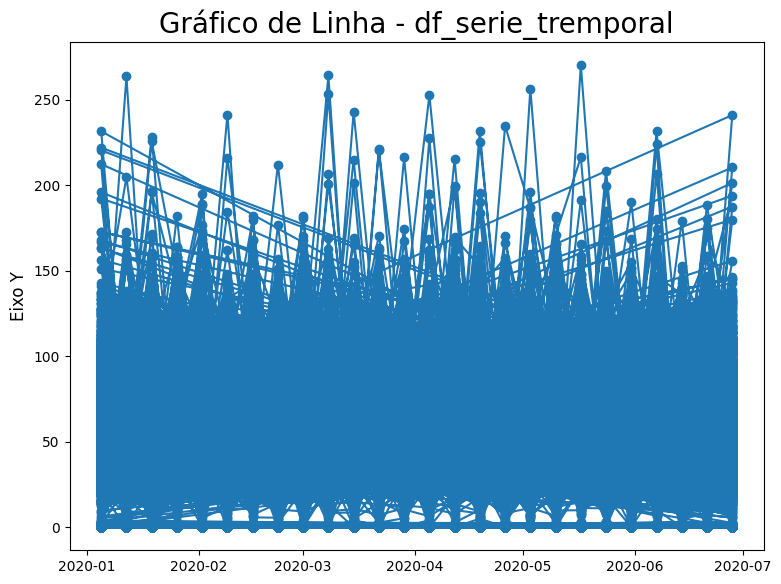

In [96]:
import matplotlib.pyplot as plt

# Defina as dimensões da figura (por exemplo, 8 polegadas de largura por 6 polegadas de altura)
plt.figure(figsize=(8, 6))

# Plote os dados
plt.plot(df_serie_tremporal['y'], 'o-')

# Adicione rótulos e título
plt.ylabel('Eixo Y')
plt.title('Gráfico de Linha - df_serie_tremporal')

# Exiba o gráfico
plt.show()



In [84]:
from statsmodels.tsa.stattools import adfuller

result=adfuller(df_serie_tremporal['y'].dropna())
print(f'Teste ADF:{result[0]}')
print(f'p-valor:{result[1]}')

Teste ADF:-10.429746253526588
p-valor:1.6223495294082725e-18


In [85]:
#!pip install pmdarima

#from pmdarima import auto_arima

In [86]:

from statsmodels.tsa.statespace.sarimax import SARIMAX

model = SARIMAX(df_serie_tremporal,order=(2,1,2),  seasonal_order=(1, 1, 2, 6))
resultado_sarimax = model.fit()


c:\Users\joaop\AppData\Local\Programs\Python\Python311\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\joaop\AppData\Local\Programs\Python\Python311\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it is not monotonic and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\joaop\AppData\Local\Programs\Python\Python311\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\joaop\AppData\Local\Programs\Python\Python311\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it is not mo

In [87]:
# resultados do modelo SARIMAX(2,1,2)
resultado_sarimax.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                     
=========================================================================================
Dep. Variable:                                 y   No. Observations:                91000
Model:             SARIMAX(2, 1, 2)x(1, 1, 2, 6)   Log Likelihood             -392783.483
Date:                           Wed, 29 Nov 2023   AIC                         785582.967
Time:                                   10:53:01   BIC                         785658.315
Sample:                                        0   HQIC                        785605.930
                                         - 91000                                         
Covariance Type:                             opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.7809      0.190     -4.102      0.000      -1.154      -0.408
ar.L2         -0.0058      0.003     -1.812      0.070      -0.012       0.000
ma.L1         -0.0400      0.190     -0.210      0.834      -0.413       0.333
ma.L2         -0.6363      0.156     -4.066      0.000      -0.943      -0.330
ar.S.L6       -0.9719      0.165     -5.901      0.000      -1.295      -0.649
ma.S.L6       -0.0277      0.164     -0.169      0.866      -0.349       0.294
ma.S.L12      -0.9720      0.164     -5.927      0.000      -1.293      -0.651
sigma2       328.5417      0.741    443.183      0.000     327.089     329.995
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):            192919.76
Prob(Q):                              1.00   Prob(JB):                         0.00
Heteroskedasticity (H):               0.59   Skew:                             1.18
Prob(H) (two-sided):                  0.00   Kurtosis:                         9.73
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [88]:
# Vamos realizar um "backtesting" com predições de valores dos 12 meses anteriores
predicoes = resultado_sarimax.get_prediction(start=-12)
predicao_media = predicoes.predicted_mean

In [89]:
# intervalo de confiança

intervalo_confianca = predicoes.conf_int()
limites_abaixo = intervalo_confianca.iloc[:,0]
limites_acima = intervalo_confianca.iloc[:,1]

limites_abaixo[0], limites_acima[0]

(-35.237225134724014, 35.81434594126391)

In [90]:
predicao_media[0]

0.2885604032699511

In [91]:
datas_previsao = np.asarray(predicao_media.index)
datas = np.asarray(df.index)

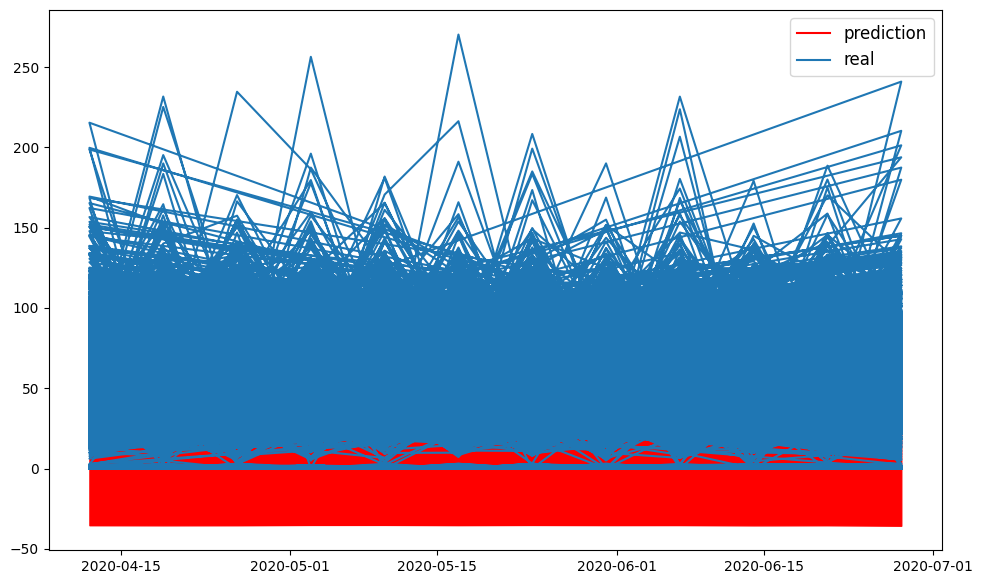

In [98]:
plt.figure(figsize=(10, 6))

# Reduza o DataFrame ao intervalo de datas que você está prevendo
df_serie_tremporal_reduzido = df_serie_tremporal[df_serie_tremporal.index.isin(datas_previsao)]

# Plote a previsão
plt.plot(datas_previsao, predicao_media.values, color='red', label='prediction')
plt.fill_between(datas_previsao, limites_abaixo, limites_acima, color='red')

# Plote os dados reais
plt.plot(df_serie_tremporal_reduzido.index, df_serie_tremporal_reduzido['y'].values, label='real')

plt.legend()
plt.show()


In [95]:
from sklearn.metrics import mean_squared_error
from math import sqrt

# Extrair os valores numéricos das séries temporais
df_values = df_serie_tremporal[-12:].values.flatten()
predicao_media_values = predicao_media.values.flatten()

# Calcular o RMSE
rmse_sarima = sqrt(mean_squared_error(df_values, predicao_media_values))
print(rmse_sarima)


0.5999044051280693


In [ ]:
fdf

NameError: name 'fdf' is not defined

# USANDO O ALGORITMO PROFETA

## Instalar a Biblioteca

In [ ]:
#INstalação do Frameworking
!python -m pip install prophet

In [ ]:
# Importa as Bibliotecas
from prophet import Prophet
import pandas as pd
import plotly.graph_objs as go
from plotly.subplots import make_subplots

## Criado o modelo de IA

In [ ]:
import pandas as pd
from prophet import Prophet


# Supondo que 'x' seja a coluna de datas e 'y' seja a coluna de valores
df_serie_temporal = df_2020_df[['x', 'y']]
df_serie_temporal.columns = ['ds', 'y']

# Ajustar o modelo ao DataFrame
model = Prophet()
model.fit(df_serie_temporal)


10:38:59 - cmdstanpy - INFO - Chain [1] start processing
10:39:20 - cmdstanpy - INFO - Chain [1] done processing


In [ ]:
df_serie_temporal.head()

,ds,y
261,2020-01-05,52.085029
262,2020-01-12,33.423704
263,2020-01-19,30.279157
264,2020-01-26,34.008818
265,2020-02-02,32.873530


## Fazendo novas Previsões

In [ ]:
# Crie um DataFrame com datas futuras para as previsões
future = model.make_future_dataframe(periods=12, freq='M')  # Vamos prever 12 meses no futuro

# Faça as previsões
forecast = model.predict(future)

In [ ]:
forecast.head()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2020-01-05,52.696337,16.396179,87.661954,52.696337,52.696337,0.0,0.0,0.0,0.0,0.0,0.0,52.696337
1,2020-01-12,52.599137,16.929651,89.074622,52.599137,52.599137,0.0,0.0,0.0,0.0,0.0,0.0,52.599137
2,2020-01-19,52.502963,15.636314,90.046149,52.502963,52.502963,0.0,0.0,0.0,0.0,0.0,0.0,52.502963
3,2020-01-26,52.403978,15.913871,88.732585,52.403978,52.403978,0.0,0.0,0.0,0.0,0.0,0.0,52.403978
4,2020-02-02,52.308403,16.035195,90.137997,52.308403,52.308403,0.0,0.0,0.0,0.0,0.0,0.0,52.308403


## Visualizando o Resultado

In [ ]:
import plotly.express as px

# Crie um DataFrame com os pontos reais (dados históricos)
real_data = df_serie_temporal.rename(columns={'y': 'Vendas'})

# Crie um gráfico de linha interativo usando Plotly
fig = px.line(forecast, x='ds', y='yhat', title='Previsão de Vendas Mensais')
fig.add_scatter(x=real_data['ds'], y=real_data['Vendas'], mode='markers', name='Vendas Reais')
fig.update_xaxes(title_text='Data')
fig.update_yaxes(title_text='Vendas')
fig.update_traces(name='Previsão')  # Adiciona a etiqueta 'Previsão' à linha de previsão
fig.show()


#Adicionando Variáveis (regressor)

> Feature Enginnering

In [ ]:
# Suponha que 'df' seja seu DataFrame original com a coluna 'ds' representando a data.
df_serie_temporal['ds'] = pd.to_datetime(df_serie_temporal['ds'])

# Crie a variável sazonal personalizada 'estacao_do_ano' com base na data
def determinar_estacao_do_ano(data):
    if data.month in (3, 4, 5):
        return 3  # Primavera
    elif data.month in (6, 7, 8):
        return 1  # Verão
    elif data.month in (9, 10, 11):
        return 2  # Outono
    else:
        return 4  # Inverno

df_serie_temporal['estacao_do_ano'] = df_serie_temporal['ds'].apply(determinar_estacao_do_ano)

In [ ]:
df_serie_temporal.info()

<class 'pandas.core.frame.DataFrame'>
Index: 91000 entries, 261 to 946499
Data columns (total 3 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   ds              91000 non-null  datetime64[ns]
 1   y               91000 non-null  float64       
 2   estacao_do_ano  91000 non-null  int64         
dtypes: datetime64[ns](1), float64(1), int64(1)
memory usage: 2.8 MB


In [ ]:
df_serie_temporal.head()

,ds,y,estacao_do_ano
261,2020-01-05,52.085029,4
262,2020-01-12,33.423704,4
263,2020-01-19,30.279157,4
264,2020-01-26,34.008818,4
265,2020-02-02,32.873530,4


### Adicionando Variáveis no Modelo (Regressor)

In [ ]:
# Inicialize o modelo Prophet
model = Prophet()

# Adicione a coluna 'estacao_do_ano' como regressor
model.add_regressor('estacao_do_ano')


### Fazendo novo treinamento

In [ ]:
from prophet import Prophet

# Crie um objeto Prophet
model = Prophet()

# Ajuste o modelo aos dados históricos
model.fit(df_serie_temporal)

# Crie um DataFrame com datas futuras para as previsões
future = model.make_future_dataframe(periods=12, freq='M')  # Vamos prever 12 meses no futuro

# Faça as previsões
forecast = model.predict(future)

# Exiba as previsões
print(forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail())


10:42:27 - cmdstanpy - INFO - Chain [1] start processing
10:42:47 - cmdstanpy - INFO - Chain [1] done processing


           ds       yhat  yhat_lower  yhat_upper
33 2021-01-31  50.173150   11.610563   86.847908
34 2021-02-28  49.938850   13.563463   87.301179
35 2021-03-31  49.679446   11.809080   87.661314
36 2021-04-30  49.428410   13.419723   87.113678
37 2021-05-31  49.169006   10.133460   86.822873


In [ ]:
# Adicione a coluna estacao_do_ano ao DataFrame de previsão
forecast['estacao_do_ano'] = forecast['ds'].dt.month


### Avaliando resultado e Adicionando Gráficos com Sazonalidades e Tendências

In [ ]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import numpy as np

# Crie um subplot com duas figuras
fig = make_subplots(rows=2, cols=1, shared_xaxes=True, vertical_spacing=0.1)

# Adicione o gráfico de tendência
fig.add_trace(go.Scatter(x=forecast['ds'], y=forecast['yhat'], mode='lines', name='Tendência Prevista'), row=1, col=1)

# Adicione os valores reais com cor rosa clara e meio transparente
fig.add_trace(go.Scatter(x=df_serie_temporal['ds'], y=df_serie_temporal['y'], mode='markers', name='Valores Reais',
                         marker=dict(color='rgba(255, 182, 193, 0.5)')), row=1, col=1)

# Adicione os componentes sazonais diretamente na primeira linha do subplot
fig.add_trace(go.Scatter(x=forecast['ds'], y=forecast['estacao_do_ano'], mode='lines', name='Sazonalidade Anual'), row=1, col=1)

# Adicione a regressão manual utilizando numpy.polyfit
coeficientes = np.polyfit(forecast['ds'].astype(np.int64) // 10**9, forecast['estacao_do_ano'], 1)
linha_regressao = np.polyval(coeficientes, forecast['ds'].astype(np.int64) // 10**9)

# Adicione o gráfico de regressão estacao_do_ano diretamente na primeira linha do subplot
fig.add_trace(go.Scatter(x=forecast['ds'], y=linha_regressao, mode='lines', name='Regressor Estação do Ano'), row=1, col=1)

# Personalize o layout do gráfico
fig.update_layout(title='Previsão de Vendas com Componentes Sazonais e Valores Reais',
                  yaxis_title='Vendas',
                  showlegend=True)

# Ajuste a altura da figura para espalhar mais verticalmente
fig.update_layout(height=900)  # Ajuste conforme necessário

# Exiba o gráfico
fig.show()








## Como interpretar os valores da sazonalidade
Em geral, valores sazonais acima de 1 indicam um período em que as vendas estão acima da média sazonal esperada, enquanto valores abaixo de 1 indicam um período em que as vendas estão abaixo da média sazonal esperada. Os valores da sazonalidade ajudam a entender como os padrões sazonais afetam as vendas em diferentes períodos do ano, permitindo tomar decisões informadas sobre o planejamento e a gestão de estoque, por exemplo

# MACHINE LARNING 

## XBOOST

In [103]:
df_serie_tremporal.head()

,y,target
x,,
2020-01-12,33.423704,52.085029
2020-01-19,30.279157,33.423704
2020-01-26,34.008818,30.279157
2020-02-02,32.873530,34.008818
2020-02-09,48.949367,32.873530



### Criar a variável 'target' que armazena o valor anterior de 'y'

In [100]:
import pandas as pd
df_serie_tremporal['target'] = df_serie_tremporal['y'].shift(1)

In [102]:
df_serie_tremporal = df_serie_tremporal.dropna()
df_serie_tremporal.tail()

,y,target
x,,
2020-05-31,0.0,0.0
2020-06-07,0.0,0.0
2020-06-14,0.0,0.0
2020-06-21,0.0,0.0
2020-06-28,0.0,0.0
